In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [2]:
raw_data = pd.read_csv(r"product invoice.csv", encoding='latin1')

In [3]:
raw_data.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,01-12-2010 08:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,01-12-2010 08:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,01-12-2010 08:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,01-12-2010 08:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,01-12-2010 08:26,3.39,17850.0,United Kingdom


In [4]:
raw_data.shape

(541909, 8)

In [5]:
raw_data["Description"].nunique()

4223

In [6]:
pd.options.display.max_rows = None

In [7]:
description_unique = pd.Series(raw_data["Description"].unique())

In [8]:
print(description_unique)

0        WHITE HANGING HEART T-LIGHT HOLDER
1                       WHITE METAL LANTERN
2            CREAM CUPID HEARTS COAT HANGER
3       KNITTED UNION FLAG HOT WATER BOTTLE
4            RED WOOLLY HOTTIE WHITE HEART.
5              SET 7 BABUSHKA NESTING BOXES
6         GLASS STAR FROSTED T-LIGHT HOLDER
7                    HAND WARMER UNION JACK
8                 HAND WARMER RED POLKA DOT
9             ASSORTED COLOUR BIRD ORNAMENT
10               POPPY'S PLAYHOUSE BEDROOM 
11                POPPY'S PLAYHOUSE KITCHEN
12        FELTCRAFT PRINCESS CHARLOTTE DOLL
13                  IVORY KNITTED MUG COSY 
14       BOX OF 6 ASSORTED COLOUR TEASPOONS
15            BOX OF VINTAGE JIGSAW BLOCKS 
16           BOX OF VINTAGE ALPHABET BLOCKS
17                 HOME BUILDING BLOCK WORD
18                 LOVE BUILDING BLOCK WORD
19              RECIPE BOX WITH METAL HEART
20                      DOORMAT NEW ENGLAND
21                 JAM MAKING SET WITH JARS
22              RED COAT RACK PA

In [9]:
raw_data = raw_data.dropna(subset=["Description"])
# We can drop the rows specific to the columns

In [10]:
raw_data.shape

(540455, 8)

In [11]:
raw_data = raw_data.copy()

### working with missing values

In [12]:
raw_data.head(2)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,01-12-2010 08:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,01-12-2010 08:26,3.39,17850.0,United Kingdom


In [13]:
raw_data.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country'],
      dtype='object')

In [14]:
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 540455 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    540455 non-null  object 
 1   StockCode    540455 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     540455 non-null  int64  
 4   InvoiceDate  540455 non-null  object 
 5   UnitPrice    540455 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      540455 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 37.1+ MB


In [15]:
raw_data.shape

(540455, 8)

In [16]:
raw_data.isnull().sum()

InvoiceNo           0
StockCode           0
Description         0
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     133626
Country             0
dtype: int64

It is bad idea to delete the rows of customer ID which contains missing values as from unkonwn customers the business made sales and they contributes almost 20-25% of the sales, it could impact negtively to the business

In [17]:
data = raw_data.copy()

{'whiskers': [<matplotlib.lines.Line2D at 0x2479f213290>,
 'caps': [<matplotlib.lines.Line2D at 0x2479f232ad0>,
 'boxes': [<matplotlib.lines.Line2D at 0x2479f047c90>],
 'medians': [<matplotlib.lines.Line2D at 0x2479f244410>],
 'fliers': [<matplotlib.lines.Line2D at 0x2479f244ed0>],
 'means': []}

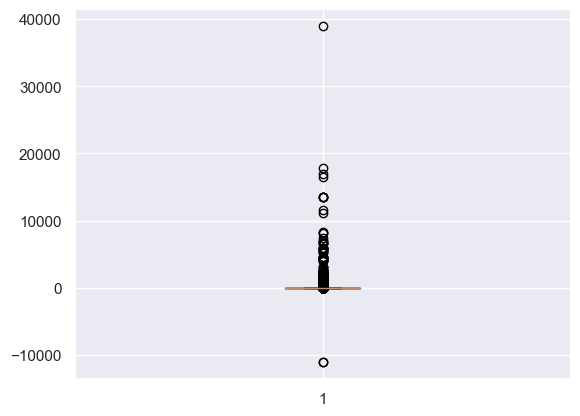

In [18]:
plt.boxplot(data["UnitPrice"])

In [19]:
data = data[data["UnitPrice"] > 0]

In [20]:
# data.drop("Description", axis=0)

{'whiskers': [<matplotlib.lines.Line2D at 0x2479f33b5d0>,
 'caps': [<matplotlib.lines.Line2D at 0x2479f34cd50>,
 'boxes': [<matplotlib.lines.Line2D at 0x2479f33ab50>],
 'medians': [<matplotlib.lines.Line2D at 0x2479f34e490>],
 'fliers': [<matplotlib.lines.Line2D at 0x2479f34ef50>],
 'means': []}

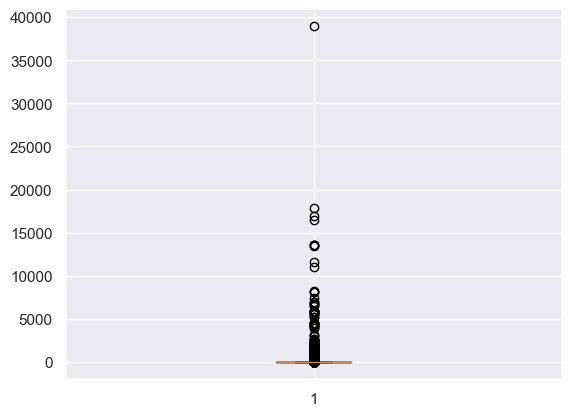

In [21]:
plt.boxplot(data["UnitPrice"])

In [22]:
remove = ["????missing", "Adjust bad data", "Discount", "?", "? sold as sets?", "??",
          "?? missing", "???", "????damages????", "???lost", "???missing", "?display?",
          "?lost", "?missing", "?sold as sets?", "check", "CHECK", "CRUK Commission", 
          "crushed", "crushed boxes", "crushed ctn", "Dagamed", "damaged", "DAMAGED", 
          "damaged stock", "damages", "damages?", "damages wax", 'damages/credits from ASOS.',
          'damages/display', 'damages/dotcom?', 'Damages/samples', 'damages/showroom etc', 
          'dotcom', 'Dotcom', 'DOTCOM POSTAGE', 'Dotcom sales', 'dotcom sales', 'Dotcom set', 
          "Dotcom sold in 6's", "dotcom sold sets", "ebay", "Manual", "POSTAGE", 're dotcom quick fix.',
          're-adjustment', "SAMPLES", "samples/damages", "smashed", "sold as 1", 'Sold as 1 on dotcom',
          'sold as 22467', 'sold as set by dotcom', 'sold as set on dotcom and amazon',
          'sold as set/6 by dotcom', 'sold in set?', 'sold with wrong barcode', 'stock check', 
          'stock creditted wrongly', 'taig adjust no stock', 'thrown away', 'test', 
          'throw away', "thrown away-can't sell", "Thrown away-rusty", "Thrown away.", 
          'Unsaleable, destroyed.', 'Water damaged', 'water damage', 'wet', 'wet boxes', 
          'wet damaged', 'wet pallet', 'Wet pallet-thrown away', 'wet rusty', 'wet?', 
          'WET/MOULDY', 'wet/rusty', 'wrong barcode', 'wrong barcode (22467)', 'wrong code',
          'wrong code?', 'wrongly coded 20713', 'wrongly coded-23343', 'wrongly marked carton 22804',
          'wrongly marked. 23343 in box', 'Wrongly mrked had 85123a in box', 'wrongly sold as sets',
          'wrongly sold sets']

In [23]:
for item in remove:
    if (data['Description'] == item).any():
        data.drop(data[data['Description'] == item].index, inplace=True)
        
data.reset_index(drop=True, inplace=True)

In [24]:
data.shape

(536711, 8)

In [25]:
data.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,01-12-2010 08:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,01-12-2010 08:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,01-12-2010 08:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,01-12-2010 08:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,01-12-2010 08:26,3.39,17850.0,United Kingdom


In [26]:
countries = []

for i in range(raw_data.shape[0]):
    if raw_data.iloc[i].isna().any():
        countries.append(raw_data["Country"].iloc[i])

In [27]:
countries = pd.Series(countries)
value_counts = countries.value_counts()
value_counts.sum()

133626

In [28]:
value_counts.iloc[0]/value_counts.sum()

0.9889243111370541

from above I evaluated that almost 99 percentage of the sales are from UK so we can fill that null values with any of the customer ID related to the country UK

In first row only customer is from UK I will assign 17850 to the null values present in the dataset

In [29]:
data = data.fillna(17850)

In [30]:
data.isna().sum()

InvoiceNo      0
StockCode      0
Description    0
Quantity       0
InvoiceDate    0
UnitPrice      0
CustomerID     0
Country        0
dtype: int64

In [31]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 536711 entries, 0 to 536710
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    536711 non-null  object 
 1   StockCode    536711 non-null  object 
 2   Description  536711 non-null  object 
 3   Quantity     536711 non-null  int64  
 4   InvoiceDate  536711 non-null  object 
 5   UnitPrice    536711 non-null  float64
 6   CustomerID   536711 non-null  float64
 7   Country      536711 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 32.8+ MB


##### Dropping unncessary features

In [32]:
data.drop(["InvoiceNo", "StockCode"], axis=1, inplace=True)

In [33]:
data.columns

Index(['Description', 'Quantity', 'InvoiceDate', 'UnitPrice', 'CustomerID',
       'Country'],
      dtype='object')

In [34]:
data = data.copy()

#### converting the data type of customer ID

In [35]:
data.shape

(536711, 6)

In [36]:
data["CustomerID"] = data["CustomerID"].astype(int)

In [37]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 536711 entries, 0 to 536710
Data columns (total 6 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Description  536711 non-null  object 
 1   Quantity     536711 non-null  int64  
 2   InvoiceDate  536711 non-null  object 
 3   UnitPrice    536711 non-null  float64
 4   CustomerID   536711 non-null  int32  
 5   Country      536711 non-null  object 
dtypes: float64(1), int32(1), int64(1), object(3)
memory usage: 22.5+ MB


In [38]:
data["InvoiceDate"] = pd.to_datetime(data["InvoiceDate"], dayfirst=True)

In [39]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 536711 entries, 0 to 536710
Data columns (total 6 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   Description  536711 non-null  object        
 1   Quantity     536711 non-null  int64         
 2   InvoiceDate  536711 non-null  datetime64[ns]
 3   UnitPrice    536711 non-null  float64       
 4   CustomerID   536711 non-null  int32         
 5   Country      536711 non-null  object        
dtypes: datetime64[ns](1), float64(1), int32(1), int64(1), object(2)
memory usage: 22.5+ MB


There is no other such features which is needed to change their data type

#### Adding new feature Sales 
it contains the total sales per customer
###### Formula:
        Qunatity * UnitPrice
multiplying UnitPrice with overall quantities bought by coustomer for particular date and particular product 

In [40]:
data["Sales"] = data["Quantity"] * data["UnitPrice"]

In [41]:
data["Sales"]

0             15.300
1             20.340
2             22.000
3             20.340
4             20.340
5             15.300
6             25.500
7             11.100
8             11.100
9             54.080
10            12.600
11            12.600
12            30.000
13             9.900
14            25.500
15            14.850
16            19.900
17            17.850
18            17.850
19            31.800
20            31.800
21            25.500
22            14.850
23            14.850
24            14.850
25            17.850
26            90.000
27            90.000
28            45.000
29            10.200
30            15.600
31            40.800
32            30.000
33            53.100
34            70.800
35            46.800
36            46.800
37            46.800
38            17.000
39            39.600
40            70.800
41            45.000
42            10.080
43            10.080
44            23.400
45           204.000
46            11.100
47           

Successfully added the column

In [42]:
data.head(5)

,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Sales
0,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,15.30
1,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34
2,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,22.00
3,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34
4,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34


#### Describing the categorical and numerical features

In [43]:
cat_data = data[['Description', 'InvoiceDate', 'Country']]
num_data = data[['Quantity', 'UnitPrice', 'CustomerID', "Sales"]]

In [44]:
categorical_data = pd.DataFrame(cat_data)
numerical_data = pd.DataFrame(num_data)

In [45]:
numerical_data.describe()

,Quantity,UnitPrice,CustomerID,Sales
count,536711.000000,536711.000000,536711.000000,536711.000000
mean,9.884657,3.795611,15921.893747,17.854575
std,215.911042,70.455959,1848.208894,374.547580
min,-80995.000000,0.001000,12346.000000,-168469.600000
25%,1.000000,1.250000,14367.000000,3.750000
50%,3.000000,2.080000,16241.000000,9.780000
75%,10.000000,4.130000,17850.000000,17.400000
max,80995.000000,17836.460000,18287.000000,168469.600000


In [46]:
numerical_data[numerical_data['Quantity']== 80995]

,Quantity,UnitPrice,CustomerID,Sales
535231,80995,2.08,16446,168469.6


In [47]:
numerical_data[numerical_data['UnitPrice'] == 38970]

,Quantity,UnitPrice,CustomerID,Sales


In [48]:
numerical_data['CustomerID'].max()

18287

### Conncecting to Database

In [49]:
import pymysql

In [50]:
conn = pymysql.connect(database="tata_retail", user="root", password="@MySQL143")

In [51]:
cursor = conn.cursor()

#### creating checkpoint

In [52]:
data = data.copy()

In [53]:
cursor.execute("SELECT * FROM tata_retail")

0

##### inserting values

In [54]:
import time

In [55]:
data.shape

(536711, 7)

In [56]:
data.shape[0] * data.shape[1]

3756977

In [57]:
start_time = time.time()

# Construct the SQL query with placeholders
query = "INSERT INTO tata_retail VALUES (" + ','.join(['%s'] * data.shape[1]) + ")"

# Initialize a list to store all row values
values = []

# Iterate over the rows in the DataFrame and extract row values
for i in range(data.shape[0]):
    values.append(tuple(data.iloc[i]))

# Execute the bulk insert query with the list of values
cursor.executemany(query, values)

end_time = time.time()

execution_time = end_time - start_time
print("Execution time:", execution_time, "seconds")


Execution time: 50.6136417388916 seconds


In [58]:
conn.commit()

In [59]:
cursor.execute("SELECT * FROM tata_retail")

536711

In [60]:
conn.close()

In [61]:
pip install pandoc

Note: you may need to restart the kernel to use updated packages.
